In [ ]:
import os
import glob as glob
import matplotlib.pyplot as plt
import cv2
import requests

In [ ]:
TRAIN = True
# Number of epochs to train for.
EPOCHS = 25

In [ ]:
def download_file(url, save_name):
    url = url
    if not os.path.exists(save_name):
        file = requests.get(url)
        open(save_name, 'wb').write(file.content)
    else:
        print('File already present, skipping download...')

In [ ]:
#https://universe.roboflow.com/ds/FrPYW1LIE0?key=5wujI3rMlE

In [ ]:
if not os.path.exists('train'):
    !curl -L "https://universe.roboflow.com/ds/FrPYW1LIE0?key=5wujI3rMlE" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip

    dirs = ['train', 'valid', 'test']

    for i, dir_name in enumerate(dirs):
        all_image_names = sorted(os.listdir(f"{dir_name}/images/"))
        for j, image_name in enumerate(all_image_names):
            if (j % 2) == 0:
                file_name = image_name.split('.jpg')[0]
                os.remove(f"{dir_name}/images/{image_name}")
                os.remove(f"{dir_name}/labels/{file_name}.txt")

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   910  100   910    0     0   1555      0 --:--:-- --:--:-- --:--:--  1555
100  132M  100  132M    0     0  14.9M      0  0:00:08  0:00:08 --:--:-- 22.3M
Archive:  roboflow.zip
 extracting: README.dataset.txt      
 extracting: README.roboflow.txt     
 extracting: data.yaml               
   creating: test/
   creating: test/images/
 extracting: test/images/416536556_7209359705787581_7005850060369918163_n_mp4-29_jpg.rf.7a00160660c221dcebc7a774db4b1d84.jpg  
 extracting: test/images/416536556_7209359705787581_7005850060369918163_n_mp4-3_jpg.rf.0b31f6cee202af7574e7a090dbc7cd00.jpg  
 extracting: test/images/416536556_7209359705787581_7005850060369918163_n_mp4-6_jpg.rf.25805f315910a75de5d57fc0bccaec39.jpg  
 extracting: test/images/416536556_7209359705787581_7005850060369918163_n_mp4-7_jpg.rf.5881392b873ae8ebc19c32ed2c9a6bab.jpg

In [ ]:
if not os.path.exists('yolov5'):
    !git clone https://github.com/ultralytics/yolov5.git

Cloning into 'yolov5'...
remote: Enumerating objects: 16283, done.
remote: Counting objects: 100% (180/180), done.
remote: Compressing objects: 100% (147/147), done.
remote: Total 16283 (delta 76), reused 93 (delta 33), pack-reused 16103
Receiving objects: 100% (16283/16283), 15.10 MiB | 17.58 MiB/s, done.
Resolving deltas: 100% (11111/11111), done.


In [ ]:
# if not os.path.exists('train'):
#     !curl -L "https://public.roboflow.com/ds/xMcvfiDATs?key=4lTz5YM7nW" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip

In [ ]:
%cd yolov5/
!pwd

/content/yolov5
/content/yolov5


In [ ]:
!pip install -r requirements.txt

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 196.4/196.4 kB 3.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 57.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 699.2/699.2 kB 61.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 5.9 MB/s eta 0:00:00
  Attempting uninstall: Pillow
    Found existing installation: Pillow 9.4.0
    Uninstalling Pillow-9.4.0:
      Successfully uninstalled Pillow-9.4.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
imageio 2.31.6 requires pillow<10.1.0,>=8.3.2, but you have pillow 10.2.0 which is incompatible.


In [ ]:
  %load_ext tensorboard
  %tensorboard --logdir run/train

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 2196), started 0:00:53 ago. (Use '!kill 2196' to kill it.)

<IPython.core.display.Javascript object>

In [ ]:
RES_DIR = set_res_dir()
!python train.py --data ../data.yaml --weights yolov5s.pt \
    --img 640 --epochs {EPOCHS} --batch-size 16 --name {RES_DIR}

Current number of result directories:0
results_1
2024-01-12 03:59:15.079101: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-01-12 03:59:15.079162: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-01-12 03:59:15.081013: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
train: weights=yolov5s.pt, cfg=, data=../data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=25, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, evolve_population=data/hyps, resume_evolve=None, bucket=, cache=None, image_weights=False,

In [ ]:
def set_res_dir():
  res_dir_count = len (glob.glob('runs/train/*'))
  print(f"Current number of result directories:{res_dir_count}")
  if TRAIN:
    RES_DIR =f"results_{res_dir_count+1}"
    print(RES_DIR)
  else:
    RES_DIR = f"results_{res_dir_count}"
  return RES_DIR

In [ ]:
# Function to show validation predictions saved during training.
def show_valid_results(RES_DIR):
    !ls runs/train/{RES_DIR}
    EXP_PATH = f"runs/train/{RES_DIR}"
    validation_pred_images = glob.glob(f"{EXP_PATH}/*_pred.jpg")
    print(validation_pred_images)
    for pred_image in validation_pred_images:
        image = cv2.imread(pred_image)
        plt.figure(figsize=(19, 16))
        plt.imshow(image[:, :, ::-1])
        plt.axis('off')
        plt.show()

confusion_matrix.png				    PR_curve.png	   val_batch0_pred.jpg
events.out.tfevents.1704983209.3bd129069f8a.4160.0  R_curve.png		   val_batch1_labels.jpg
F1_curve.png					    results.csv		   val_batch1_pred.jpg
hyp.yaml					    results.png		   val_batch2_labels.jpg
labels_correlogram.jpg				    train_batch0.jpg	   val_batch2_pred.jpg
labels.jpg					    train_batch1.jpg	   weights
opt.yaml					    train_batch2.jpg
P_curve.png					    val_batch0_labels.jpg
['runs/train/results_1/val_batch2_pred.jpg', 'runs/train/results_1/val_batch1_pred.jpg', 'runs/train/results_1/val_batch0_pred.jpg']


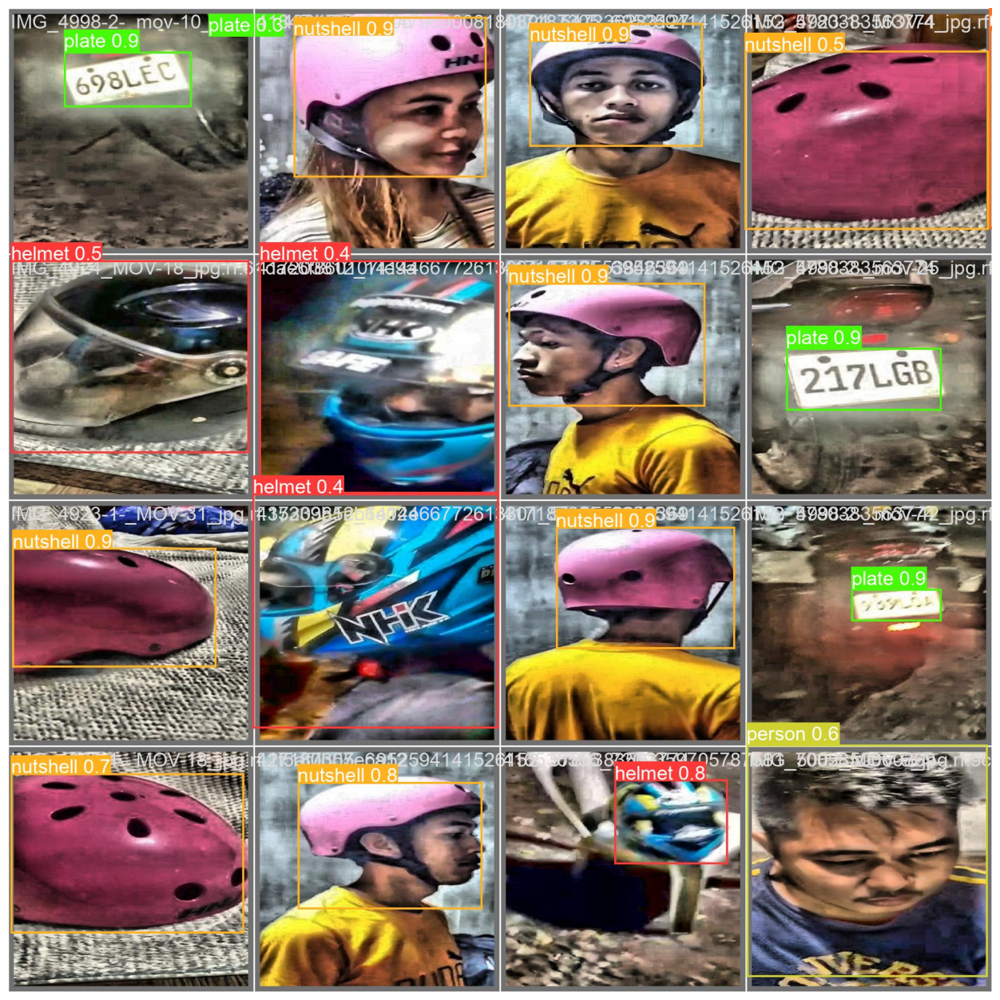

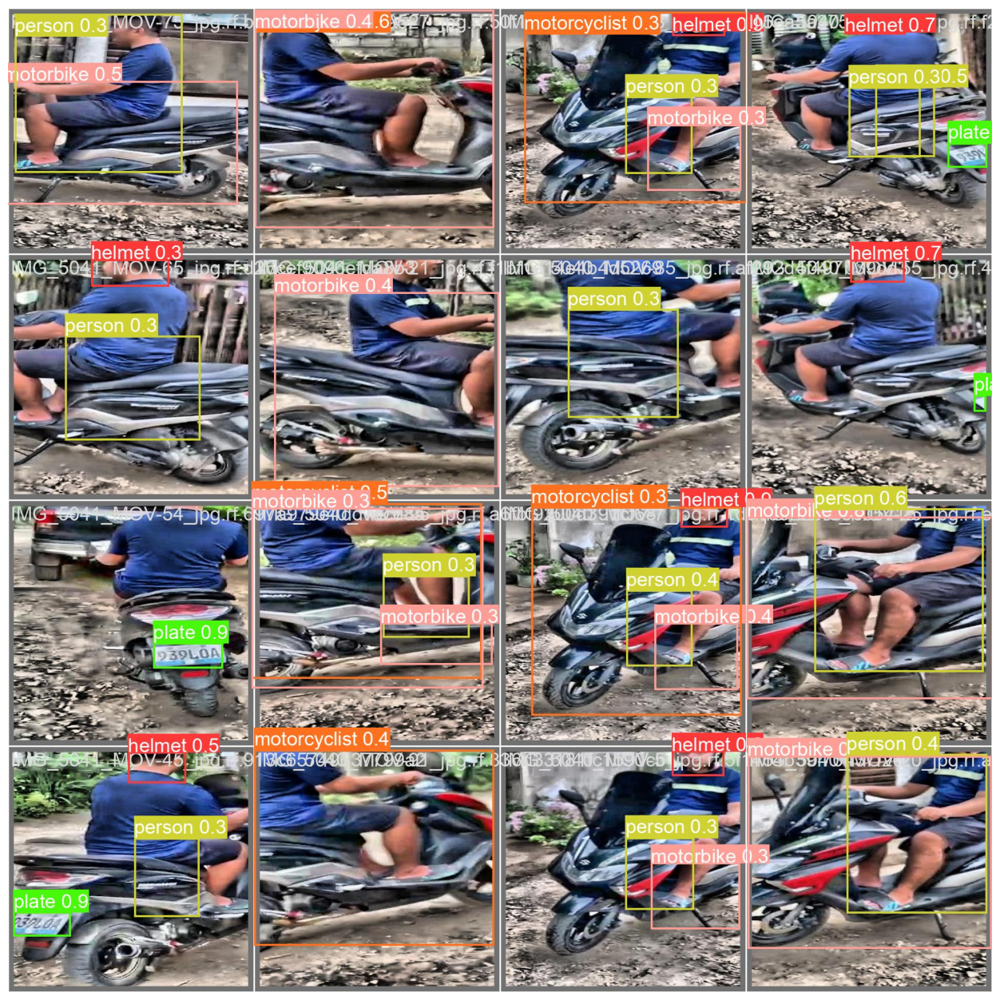

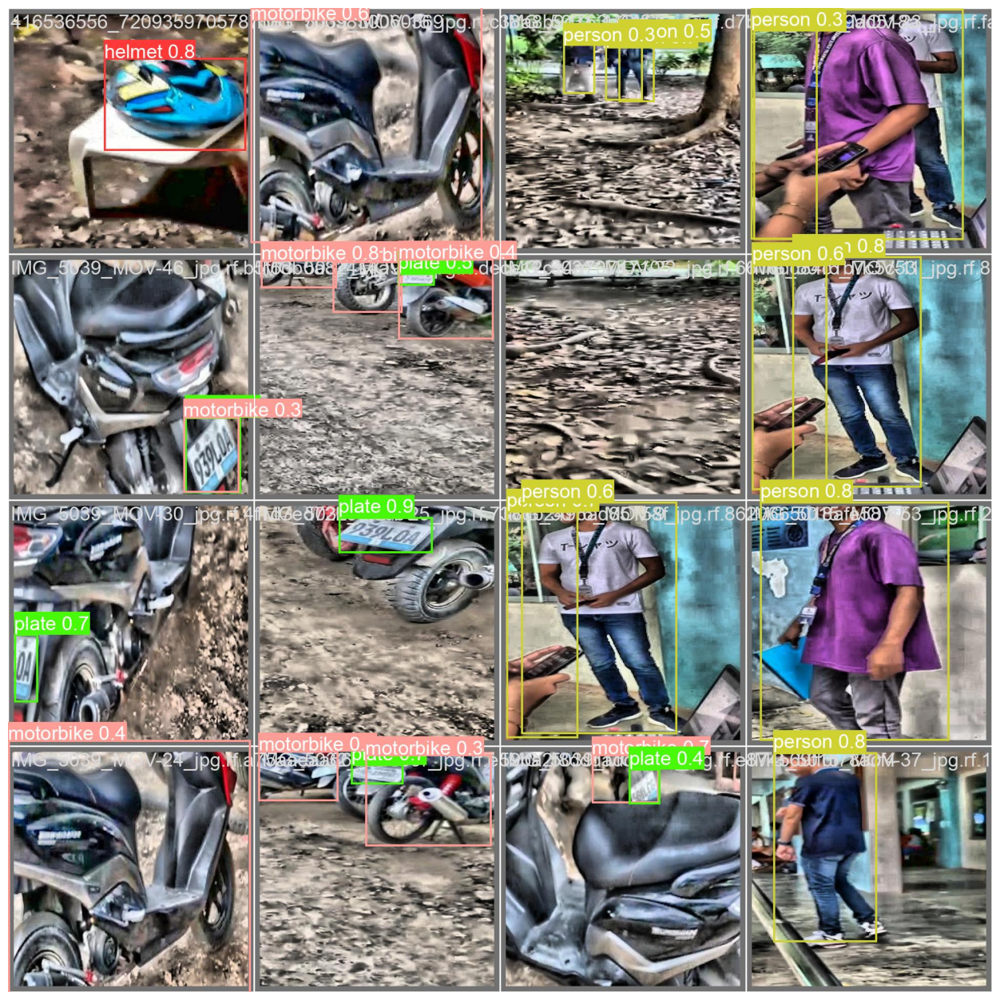

In [ ]:
show_valid_results(RES_DIR)

In [ ]:
#!python train.py --img 416 --batch 8 --epochs 50 --data.yaml --weights yolov5s.pt --nosave --cache


In [ ]:
#!python test.py --weights /content/yolov5/runs/train/results_1/ --data coco128.yaml --img 416


In [ ]:
# runs/train/results_1